<a href="https://colab.research.google.com/github/brianegge/tensorrt_demos/blob/master/garbage_bin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Tensorflow Object Detection with custom dataset in Google Colab

Jupyter notebook providing steps to retrain a [ModelZoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md) model with custom dataset.

It runs in [Google Colab](https://colab.research.google.com) using [Tensorflow Object Detection API](https://github.com/tensorflow/models/tree/master/research/object_detection).

**Requirements are only dataset images and annotations file.**

**Colab Runtime type: Python3, GPU enabled.**



#Create Dataset

I generated dataset annotations with [LabelImg](https://github.com/tzutalin/labelImg).




# Install required packages


In [4]:
!apt-get install -y -qq protobuf-compiler python-pil python-lxml python-tk

!pip install -q Cython contextlib2 pillow lxml matplotlib PyDrive

!pip install -q pycocotools

# Install old version to avoid 
# [TensorRT] ERROR: UffParser: Validator error: FeatureExtractor/MobilenetV2/layer_19_2_Conv2d_4_3x3_s2_256/BatchNorm/FusedBatchNormV3: Unsupported operation _FusedBatchNormV3
!pip install tensorflow==1.14.0 tensorflow-gpu==1.14.0
!pip freeze | grep tensor
import tensorflow as tf
print(tf.__version__)

import os
os.chdir('/content/')
!rm -fr models
!git clone https://github.com/tensorflow/models.git

os.chdir('/content/models/research')
!git checkout ae0a9409212d0072938fa60c9f85740bb89ced7e
#!git checkout master
!git apply < /content/gdrive/My\ Drive/dev/garbage_bin/anchor.patch
#!cat object_detection/anchor_generators/multiple_grid_anchor_generator.py
!protoc object_detection/protos/*.proto --python_out=.

import sys
sys.path.append('/content/models/research/slim')

%run object_detection/builders/model_builder_test.py

  Using cached https://files.pythonhosted.org/packages/de/f0/96fb2e0412ae9692dbf400e5b04432885f677ad6241c088ccc5fe7724d69/tensorflow-1.14.0-cp36-cp36m-manylinux1_x86_64.whl
  Using cached https://files.pythonhosted.org/packages/76/04/43153bfdfcf6c9a4c38ecdb971ca9a75b9a791bb69a764d652c359aca504/tensorflow_gpu-1.14.0-cp36-cp36m-manylinux1_x86_64.whl
  Using cached https://files.pythonhosted.org/packages/91/2d/2ed263449a078cd9c8a9ba50ebd50123adf1f8cfbea1492f9084169b89d9/tensorboard-1.14.0-py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/3c/d5/21860a5b11caf0678fbc8319341b0ae21a07156911132e0e71bffed0510d/tensorflow_estimator-1.14.0-py2.py3-none-any.whl
  Found existing installation: tensorboard 1.13.1
    Uninstalling tensorboard-1.13.1:
      Successfully uninstalled tensorboard-1.13.1
  Found existing installation: tensorflow-estimator 1.13.0
    Uninstalling tensorflow-estimator-1.13.0:
      Successfully uninstalled tensorflow-estimator-1.13.0
  Found existing ins

mesh-tensorflow==0.1.9
tensor2tensor==1.14.1
tensorboard==1.14.0
tensorboardcolab==0.0.22
tensorflow==1.14.0
tensorflow-datasets==2.0.0
tensorflow-estimator==1.14.0
tensorflow-gan==2.0.0
tensorflow-gpu==1.14.0
tensorflow-hub==0.7.0
tensorflow-metadata==0.21.1
tensorflow-privacy==0.2.2
tensorflow-probability==0.7.0
1.13.1
Cloning into 'models'...
remote: Enumerating objects: 34172, done.
remote: Total 34172 (delta 0), reused 0 (delta 0), pack-reused 34172
Receiving objects: 100% (34172/34172), 512.29 MiB | 40.22 MiB/s, done.
Resolving deltas: 100% (21936/21936), done.
Checking out files: 100% (2991/2991), done.
Checking out files: 100% (2197/2197), done.
Note: checking out 'ae0a9409212d0072938fa60c9f85740bb89ced7e'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you 

EEEEEEEEEEs
ERROR: test_create_faster_rcnn_inception_resnet_v2_model_from_config (__main__.ModelBuilderTest)
----------------------------------------------------------------------
Traceback (most recent call last):
  File "/content/models/research/object_detection/builders/model_builder_test.py", line 544, in test_create_faster_rcnn_inception_resnet_v2_model_from_config
    model = model_builder.build(model_proto, is_training=True)
  File "/content/models/research/object_detection/builders/model_builder.py", line 85, in build
    return _build_faster_rcnn_model(model_config.faster_rcnn, is_training)
  File "/content/models/research/object_detection/builders/model_builder.py", line 315, in _build_faster_rcnn_model
    if isinstance(second_stage_box_predictor, box_predictor.RfcnBoxPredictor):
AttributeError: module 'object_detection.core.box_predictor' has no attribute 'RfcnBoxPredictor'

ERROR: test_create_faster_rcnn_inception_v2_model_from_config (__main__.ModelBuilderTest)
----------

SystemExit: ignored

AttributeError: ignored

# Download pretrained model

To use another model from [Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md) change MODEL var.

In [15]:
%mkdir -p ~/datalab
%cd ~/datalab
!rm -fr pretrained_model

import os
import shutil
import glob
import urllib
import tarfile

# MODEL = 'faster_rcnn_inception_v2_coco_2018_01_28'
MODEL = 'ssd_mobilenet_v2_coco'
MODEL_DATE = '2018_03_29'
MODEL_FILE = MODEL + '_' + MODEL_DATE + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'
DEST_DIR = 'pretrained_model'

if not (os.path.exists(MODEL_FILE)):
  urllib.request.urlretrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)

tar = tarfile.open(MODEL_FILE)
tar.extractall()
tar.close()

os.remove(MODEL_FILE)
if (os.path.exists(DEST_DIR)):
  shutil.rmtree(DEST_DIR)
os.rename(MODEL + '_' + MODEL_DATE, DEST_DIR)

/root/datalab


Mount Google Drive

In [4]:
from google.colab import drive
drive.mount('/content/gdrive')

root_path = '/content/gdrive/My Drive/dev/garbage_bin'  #change dir to your project folder

!cd ~
!mkdir -p ~/datalab
!cp -r "{root_path}/"* ~/datalab/


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


The cell will return the following and your needs to go to the link to retrieve the authorization code. Then you are good to go!

# Edit model config file
To you use a different pretrained model in step before, update accordingly filename var and re.sub functions in next cell.


In [33]:
%cd ~/datalab

import re

in_file = '/content/models/research/object_detection/samples/configs/{}.config'.format(MODEL)
pipeline_config_path = 'pretrained_model/pipeline.config'

# todo grab number of classes from /root/datalab/annotations/label_map.pbtxt

with open(in_file) as f:
  s = f.read()
with open(pipeline_config_path, 'w') as f:
  s = re.sub('num_classes: [0-9]+', 'num_classes: 4', s)
  s = re.sub('PATH_TO_BE_CONFIGURED/model.ckpt', 'pretrained_model/model.ckpt', s)
  s = re.sub('PATH_TO_BE_CONFIGURED/.*_train.record-\?\?\?\?\?-of-[0-9]*', 'annotations/train.record', s)
  s = re.sub('PATH_TO_BE_CONFIGURED/.*_val.record-\?\?\?\?\?-of-[0-9]*', 'annotations/test.record', s)
  s = re.sub('PATH_TO_BE_CONFIGURED/.*_map.pbtxt', 'annotations/label_map.pbtxt', s)
  s = re.sub('max_detections_per_class: 100', 'max_detections_per_class: 1', s)
  #s = re.sub('batch_size: 24', 'batch_size: 2', s)
  #s = re.sub('keep_aspect_ratio_resizer','fixed_shape_resizer',s)
  #s = re.sub('min_dimension: 600','height: 960',s)
  #s = re.sub('max_dimension: 1024','width: 540',s)
  f.write(s)
!cat {pipeline_config_path}

/root/datalab
# SSD with Mobilenet v2 configuration for MSCOCO Dataset.
# Users should configure the fine_tune_checkpoint field in the train config as
# well as the label_map_path and input_path fields in the train_input_reader and
# eval_input_reader. Search for "PATH_TO_BE_CONFIGURED" to find the fields that
# should be configured.

model {
  ssd {
    num_classes: 4
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    anchor_generator {
      ssd_anchor_generator {
        num_layers: 6
        min_scale: 0.2
        max_scale: 0.95
        aspect_ratios: 1.0
        aspect_ratios: 2.0
 

# Train model
Set num_train_steps and num_eval_steps values to change train and eval steps in training process.



In [41]:
%cd ~/datalab
! [ -d trained ] && rm -fr trained/* || mkdir -p trained

!PYTHONPATH=.:/content/models/research:/content/models/research/slim \
python /content/models/research/object_detection/model_main.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir=trained \
    --alsologtostderr \
    --num_train_steps=300 \
    --num_eval_steps=500


/root/datalab
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing

#Export trained model

Export trained model with highest step number in filename.

In [42]:
%cd ~/datalab

!rm -fr fine_tuned_model/*
lst = os.listdir('trained')
lf = filter(lambda k: 'model.ckpt-' in k, lst)
last_model = sorted(lf)[-1].replace('.meta', '')

!PYTHONPATH=.:/content/models/research:/content/models/research/slim \
python /content/models/research/object_detection/export_inference_graph.py \
    --input_type=image_tensor \
    --pipeline_config_path={pipeline_config_path} \
    --output_directory=fine_tuned_model \
    --trained_checkpoint_prefix=trained/$last_model



/root/datalab
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing

#Upload jpg image for inference

In [0]:
%cd ~/datalab

from google.colab import files
from os import path

uploaded = files.upload()
  
for name, data in uploaded.items():
  with open('image1.jpg', 'wb') as f:
    f.write(data)
    f.close()
    print('saved file ' + name)

/root/datalab


# Run inference


/content/models/research/object_detection


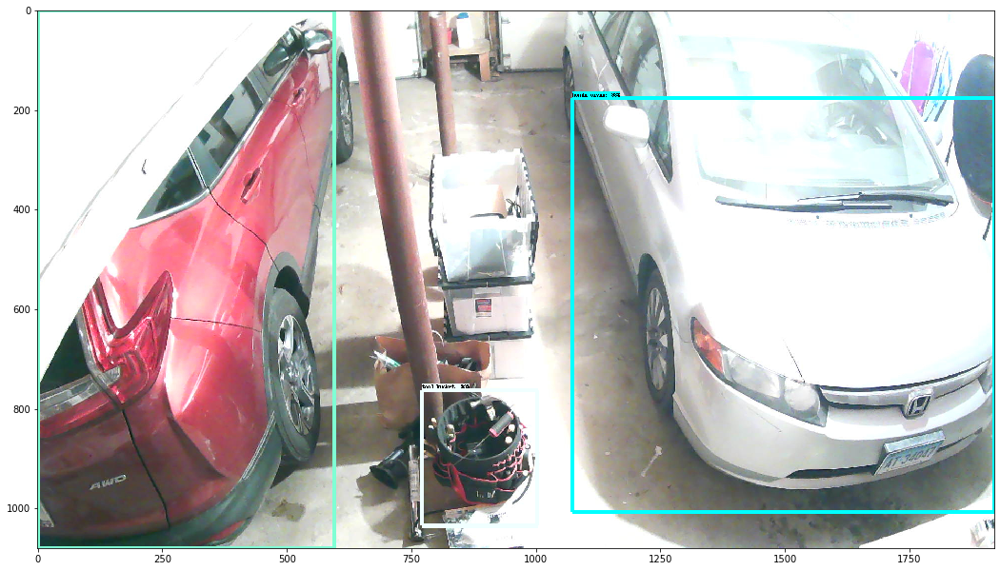

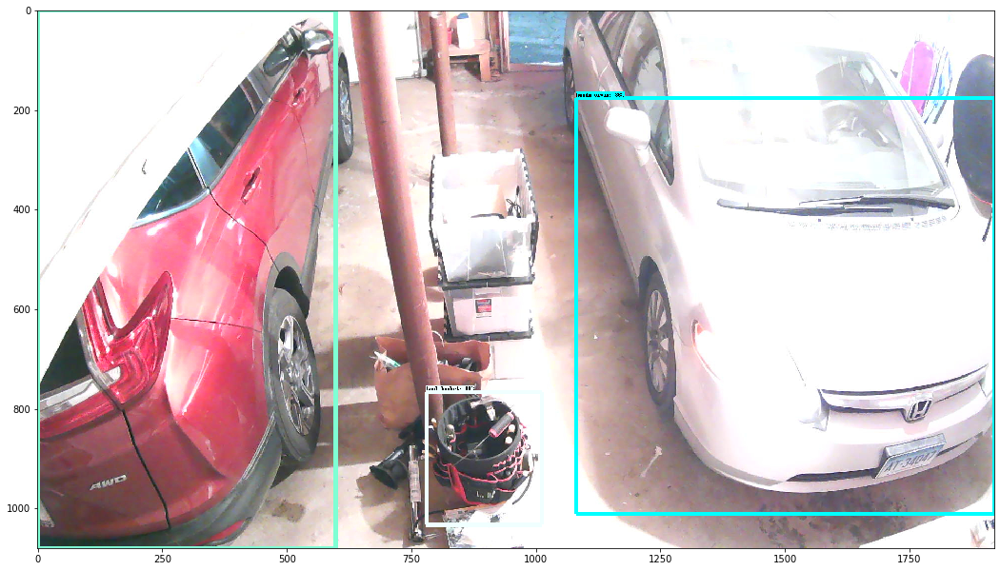

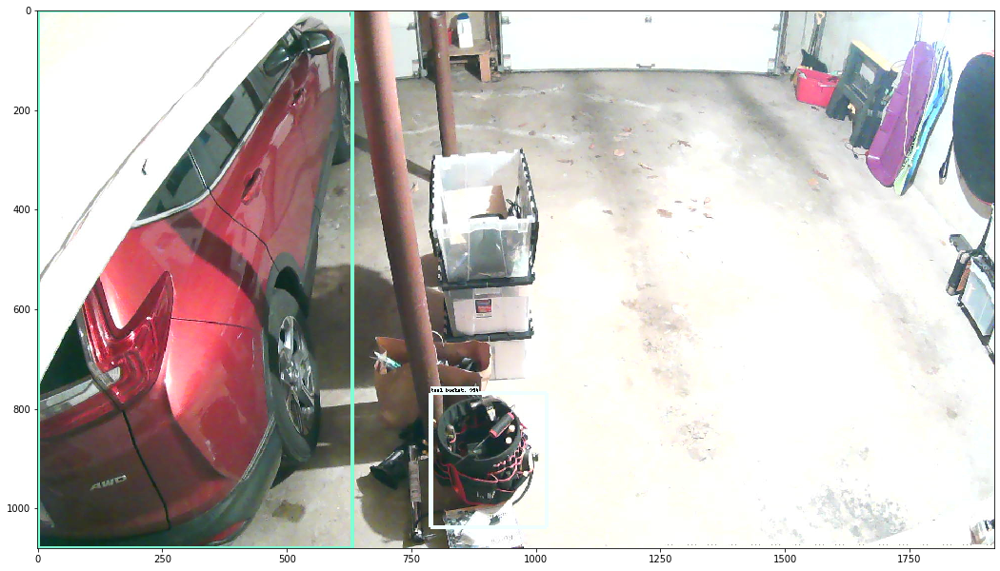

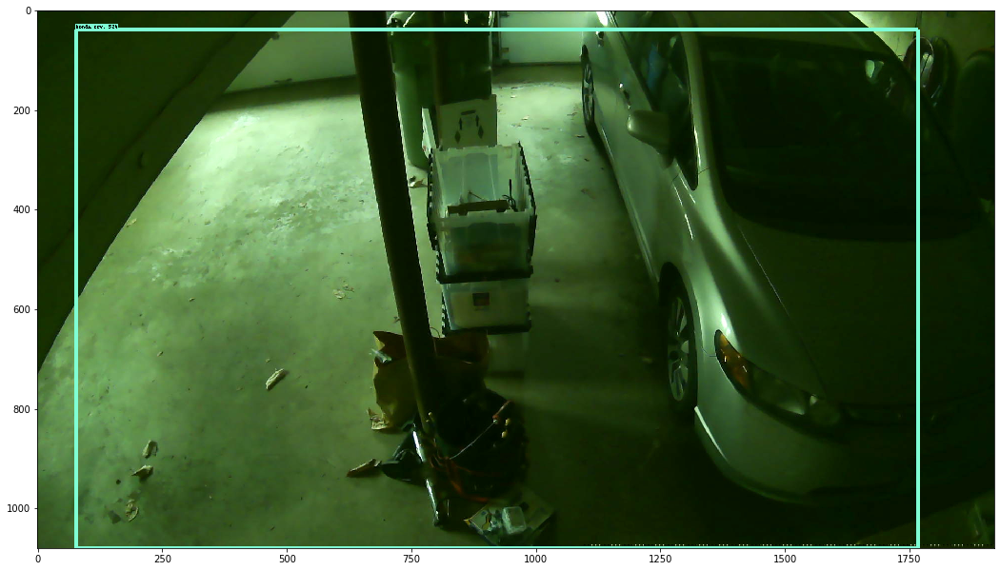

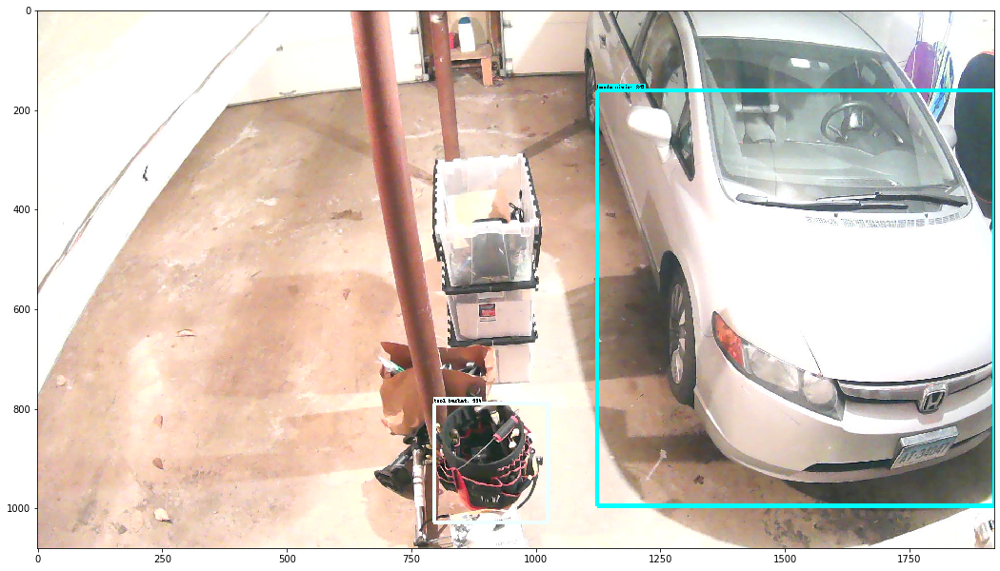

...

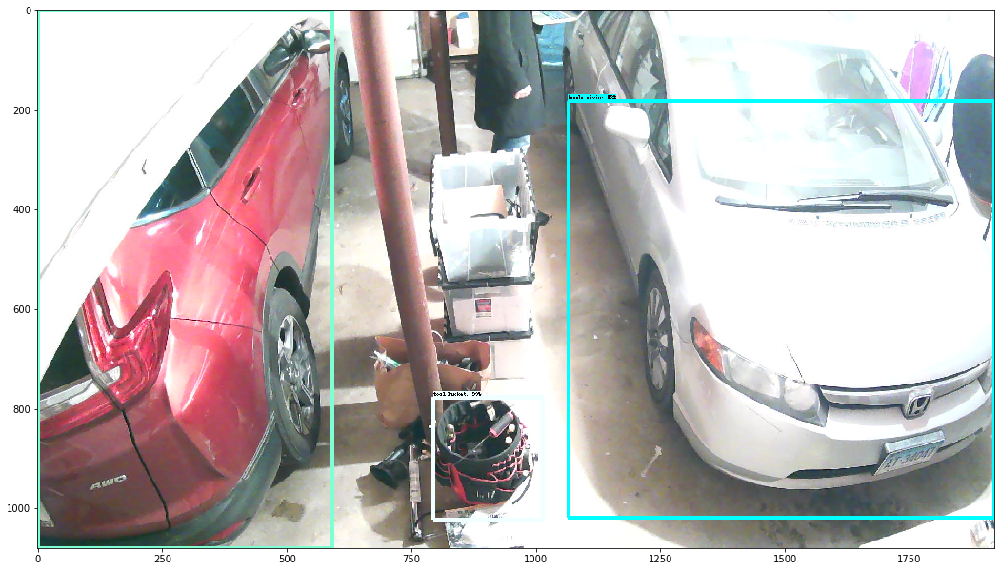

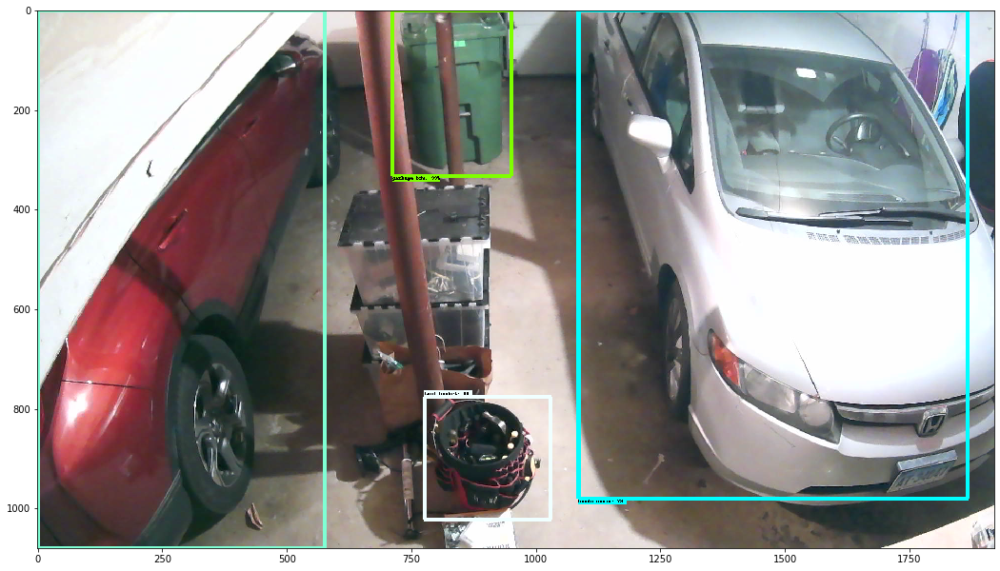

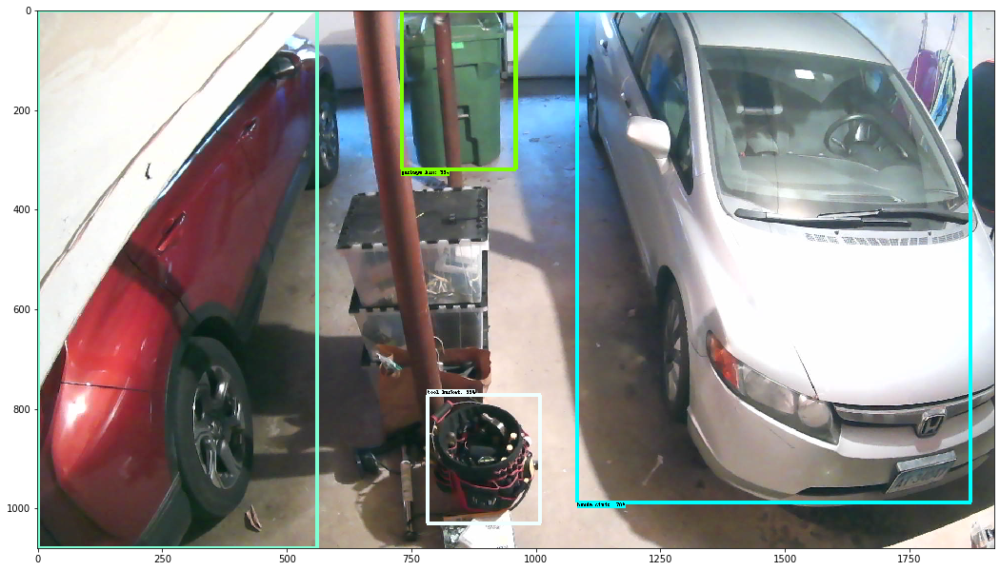

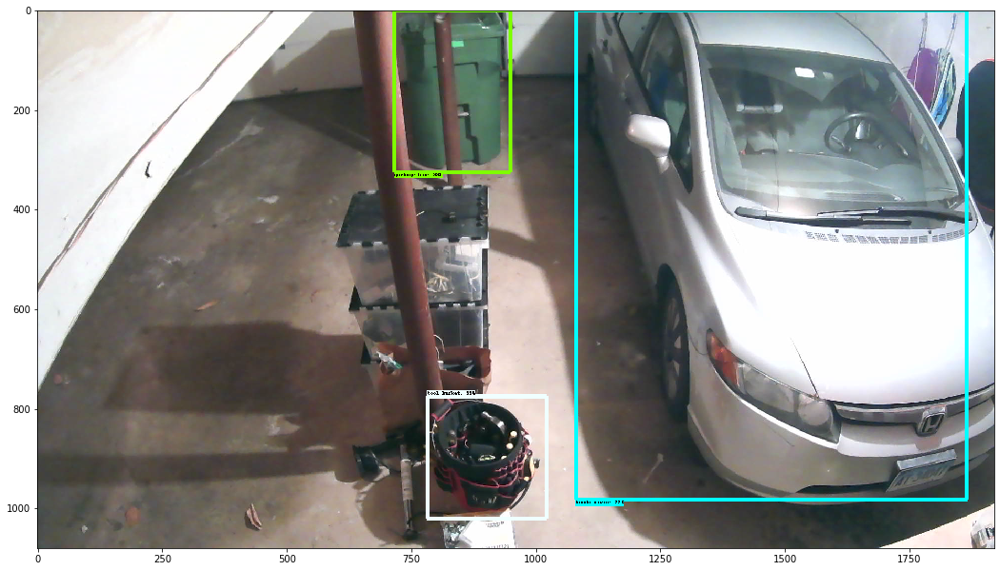

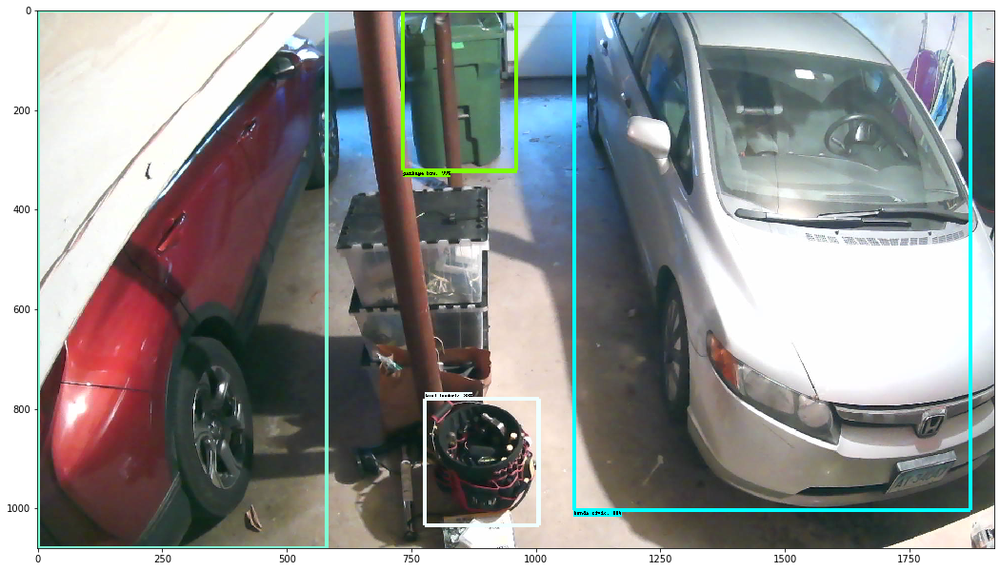

In [20]:
%cd /content/models/research/object_detection




import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import glob

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")
from object_detection.utils import ops as utils_ops

#print(tf.__version__)
#if tf.__version__ < '1.4.0':
#  raise ImportError('Please upgrade your tensorflow installation to v1.4.* or later!')
  

  
  
# This is needed to display the images.
%matplotlib inline




from utils import label_map_util

from utils import visualization_utils as vis_util




# What model to download.
# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = '/root/datalab/fine_tuned_model' + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('/root/datalab/annotations/', 'label_map.pbtxt')

NUM_CLASSES = 4

detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')
    
    
    
    
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)




def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)




# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = '/root/datalab/images'
TEST_IMAGE_PATHS = glob.glob(PATH_TO_TEST_IMAGES_DIR + '/*.jpg') + glob.glob(PATH_TO_TEST_IMAGES_DIR + '/*.png')
# Size, in inches, of the output images.
IMAGE_SIZE = (18, 12)


def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[0], image.shape[1])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: np.expand_dims(image, 0)})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.uint8)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict




for image_path in TEST_IMAGE_PATHS:
  image = Image.open(image_path)
  image.resize((960, 540))
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = load_image_into_numpy_array(image)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
  image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np, detection_graph)
  for index, score in enumerate(output_dict['detection_scores']):
    if score < 0.75:
      continue
    label = category_index[output_dict['detection_classes'][index]]['name']
    #print('{} has {}'.format(image_path,label))
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=8)
  plt.figure(figsize=IMAGE_SIZE)
  plt.imshow(image_np)
  

#Copy trained model to gdrive

In [0]:
!cp -r ~/datalab/fine_tuned_model/frozen_inference_graph.pb ~/datalab/trained/graph.pbtxt "{root_path}/"